In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
def load_and_convert_to_hsv(image_path):
    """
    Load an image from disk and convert it to both RGB (for display) and HSV (for color filtering).

    Parameters:
    - image_path: Path to the image file.

    Returns:
    - image_BGR: Original image in BGR format.
    - image_RGB: Image converted to RGB format (for display).
    - hsv: Image converted to HSV color space (for mask creation).
    """
    image_BGR = cv2.imread(image_path)
    image_RGB = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2HSV)
    return image_BGR, image_RGB, hsv

#######################################################################

def create_color_masks(hsv):
    """
    Create binary masks for various color ranges: green, brown, orange, black/dark brown, 
    and reddish-orange shades (light and dark) based on HSV values.

    Parameters:
    - hsv: HSV-converted image.

    Returns:
    - green_mask, brown_mask, orange_mask, black_brown_mask,
      reddish_orange_light_mask, reddish_orange_dark_mask: Binary masks for each color.
    """
    # Green mask
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([100, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Brown mask
    lower_brown = np.array([0, 50, 0])
    upper_brown = np.array([30, 255, 100])
    brown_mask = cv2.inRange(hsv, lower_brown, upper_brown)

    # Black / dark brown mask
    lower_black_dark_brown = np.array([0, 0, 0])
    upper_black_dark_brown = np.array([140, 255, 55])
    black_brown_mask = cv2.inRange(hsv, lower_black_dark_brown, upper_black_dark_brown)

    # Orange mask
    lower_orange = np.array([10, 100, 100])
    upper_orange = np.array([25, 255, 255])
    orange_mask = cv2.inRange(hsv, lower_orange, upper_orange)

    # Reddish-orange masks (light and dark)
    lower_reddish_orange_light = np.array([0, 100, 100])
    upper_reddish_orange_light = np.array([15, 255, 255])
    reddish_orange_light_mask = cv2.inRange(hsv, lower_reddish_orange_light, upper_reddish_orange_light)

    lower_reddish_orange_dark = np.array([0, 100, 20])
    upper_reddish_orange_dark = np.array([15, 255, 80])
    reddish_orange_dark_mask = cv2.inRange(hsv, lower_reddish_orange_dark, upper_reddish_orange_dark)

    return green_mask, brown_mask, orange_mask, black_brown_mask, reddish_orange_light_mask, reddish_orange_dark_mask
       
#######################################################################

def combine_masks(*masks):
    """
    Combine multiple binary masks into a single mask using bitwise OR.

    Parameters:
    - masks: Variable number of binary masks.

    Returns:
    - combined_mask: A single mask combining all input masks.
    """
    combined_mask = masks[0]
    for mask in masks[1:]:
        combined_mask = cv2.bitwise_or(combined_mask, mask)
    return combined_mask

#######################################################################


def apply_morphological_operations(mask, iterations=40, kernel_size=(45, 45)):
    """
    Apply morphological closing and opening operations repeatedly to clean noise in the mask.

    Parameters:
    - mask: Input binary mask.
    - iterations: Number of times to apply the morphological operations.
    - kernel_size: Size of the structuring element.

    Returns:
    - mask: Cleaned binary mask.
    """
    kernel = np.ones(kernel_size, np.uint8)
    for _ in range(iterations):
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    return mask

#######################################################################


def find_and_sort_contours(mask):
    """
    Find contours in the binary mask and sort them in descending order by area.

    Parameters:
    - mask: Binary mask.

    Returns:
    - contours_sorted: List of contours sorted by area.
    """
    contours, _ = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_sorted = sorted(contours, key=cv2.contourArea, reverse=True)
    return contours_sorted

    
#######################################################################


def draw_contours_on_image(image, contours):
    """
    Draw contours on the input image in green color.

    Parameters:
    - image: Original image (BGR or RGB).
    - contours: List of contours to draw.

    Returns:
    - image_with_contours: Image with contours drawn.
    """
    image_with_contours = image.copy()
    cv2.drawContours(image_with_contours, contours, -1, (0, 255, 0), 3)
    return image_with_contours

#######################################################################

def create_non_green_masks(hsv):
    """
    Generate a mask for non-green regions (yellow, brown, orange, and dark colors) in an HSV image.

    Parameters:
    - hsv: Image in HSV color space.

    Returns:
    - non_green_mask: Combined mask capturing all non-green regions.
    """
    # Define non-green color ranges
    lower_non_green = np.array([0, 50, 50])
    upper_non_green = np.array([22, 255, 255])
    non_green_mask_1 = cv2.inRange(hsv, lower_non_green, upper_non_green)

    lower_non_green_2 = np.array([0, 50, 0])
    upper_non_green_2 = np.array([30, 255, 100])
    non_green_mask_2 = cv2.inRange(hsv, lower_non_green_2, upper_non_green_2)

    lower_black_dark_brown = np.array([0, 0, 0])
    upper_black_dark_brown = np.array([140, 255, 55])
    black_dark_brown_mask = cv2.inRange(hsv, lower_black_dark_brown, upper_black_dark_brown)

    lower_orange = np.array([10, 100, 100])
    upper_orange = np.array([25, 255, 255])
    orange_mask = cv2.inRange(hsv, lower_orange, upper_orange)

    # Combine all masks
    non_green_mask = cv2.bitwise_or(non_green_mask_1, non_green_mask_2)
    non_green_mask = cv2.bitwise_or(non_green_mask, black_dark_brown_mask)
    non_green_mask = cv2.bitwise_or(non_green_mask, orange_mask)
    
    return non_green_mask
    
#######################################################################

def apply_mask_to_leaf_area(non_green_mask, leaf_mask_full):
    """
    Apply the non-green mask only within the leaf area defined by the full leaf mask.

    Parameters:
    - non_green_mask: Mask capturing non-green regions.
    - leaf_mask_full: Binary mask of the entire leaf area.

    Returns:
    - final_mask: Mask of non-green regions restricted to the leaf area.
    """
    final_mask = cv2.bitwise_and(non_green_mask, leaf_mask_full)
    return final_mask


#######################################################################

def display_masks(*masks, titles, figsize=(10, 4)):
    """
    Display one or more masks in a grid layout with titles.

    Parameters:
    - masks: Variable number of mask images to display.
    - titles: List of titles corresponding to each mask.
    - figsize: Size of the matplotlib figure.

    Notes:
    - Displays up to 2 images per row.
    """
    n = len(masks)
    rows = n // 2 + n % 2
    cols = 2 if n > 1 else 1

    plt.figure(figsize=figsize)
    for i, (mask, title) in enumerate(zip(masks, titles), start=1):
        plt.subplot(rows, cols, i)
        plt.imshow(mask, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()


#######################################################################

def apply_blue_mask_overlay(image_RGB, final_mask, overlay_weight=1, image_weight=1):
    """
    Overlay a blue mask on the RGB image where the final_mask indicates non-zero (active) regions.

    Parameters:
    - image_RGB: Original RGB image.
    - final_mask: Binary mask to highlight in blue.
    - overlay_weight: Weight for the blue overlay.
    - image_weight: Weight for the original image.

    Returns:
    - marked_image: RGB image with blue overlay applied where mask is active.
    """
    bool_mask = final_mask > 0
    overlay = np.zeros_like(image_RGB)
    overlay[bool_mask] = [0, 0, 255]  # Blue overlay
    marked_image = cv2.addWeighted(image_RGB, image_weight, overlay, overlay_weight, 0)
    return marked_image


In [3]:
def process_image_folder(input_folder, output_folder):
    """
    Process all images in the specified input folder by generating final disease masks,
    applying blue overlays, displaying the results, and saving both masks and overlays.

    Workflow:
    1. Load image and convert to HSV.
    2. Generate color masks and combine to detect leaf area.
    3. Apply morphological operations to refine leaf mask.
    4. Generate non-green masks to identify disease areas.
    5. Apply non-green mask within the leaf area to create the final mask.
    6. Overlay blue highlights on disease areas.
    7. Display and save both the final mask and the overlay image.

    Parameters:
    - input_folder (str): Path to the folder containing input images.
    - output_folder (str): Path to the folder where masks and overlays will be saved.
    """
    # Ensure the output and overlay subfolder exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    overlay_folder = os.path.join(output_folder, "overlays")
    if not os.path.exists(overlay_folder):
        os.makedirs(overlay_folder)

    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(input_folder, filename)
            
            # Step 1: Load and convert image to HSV
            image_BGR, image_RGB, hsv = load_and_convert_to_hsv(image_path)
            
            # Step 2: Generate color masks for leaf detection
            green_mask, brown_mask, orange_mask, black_brown_mask, reddish_orange_light_mask, reddish_orange_dark_mask = create_color_masks(hsv)
            leaf_mask = combine_masks(green_mask, brown_mask, orange_mask, black_brown_mask, reddish_orange_light_mask, reddish_orange_dark_mask)
            
            # Step 3: Clean the leaf mask
            leaf_mask = apply_morphological_operations(leaf_mask)
            
            # Step 4: Create non-green mask to detect diseased regions
            non_green_mask = create_non_green_masks(hsv)
            
            # Step 5: Apply non-green mask within the leaf area
            final_mask = apply_mask_to_leaf_area(non_green_mask, leaf_mask)
            
            # Step 6: Overlay the mask onto the original image
            marked_image = apply_blue_mask_overlay(image_RGB, final_mask)

            # Step 7: Display original, mask, and overlay
            fig, axs = plt.subplots(1, 3, figsize=(8, 8))
            axs[0].imshow(np.rot90(image_RGB))
            axs[0].set_title('Original Image')
            axs[0].axis('off')

            axs[1].imshow(np.rot90(final_mask), cmap='gray')
            axs[1].set_title('Final Mask')
            axs[1].axis('off')

            axs[2].imshow(np.rot90(marked_image))
            axs[2].set_title('Image with Mask Overlay')
            axs[2].axis('off')

            plt.tight_layout()
            plt.show()

            # Step 8: Save final mask
            save_path = os.path.join(output_folder, filename)
            cv2.imwrite(save_path, final_mask)

            # Save overlay image
            filename_without_extension = filename.rsplit('.', 1)[0]
            file_name_overlay = filename_without_extension + "_overlay.jpg"
            save_path_overlay = os.path.join(overlay_folder, file_name_overlay)
            cv2.imwrite(save_path_overlay, marked_image)

            print(f'Saved final mask to {save_path}')
            print(f'Saved overlay to {save_path_overlay}')

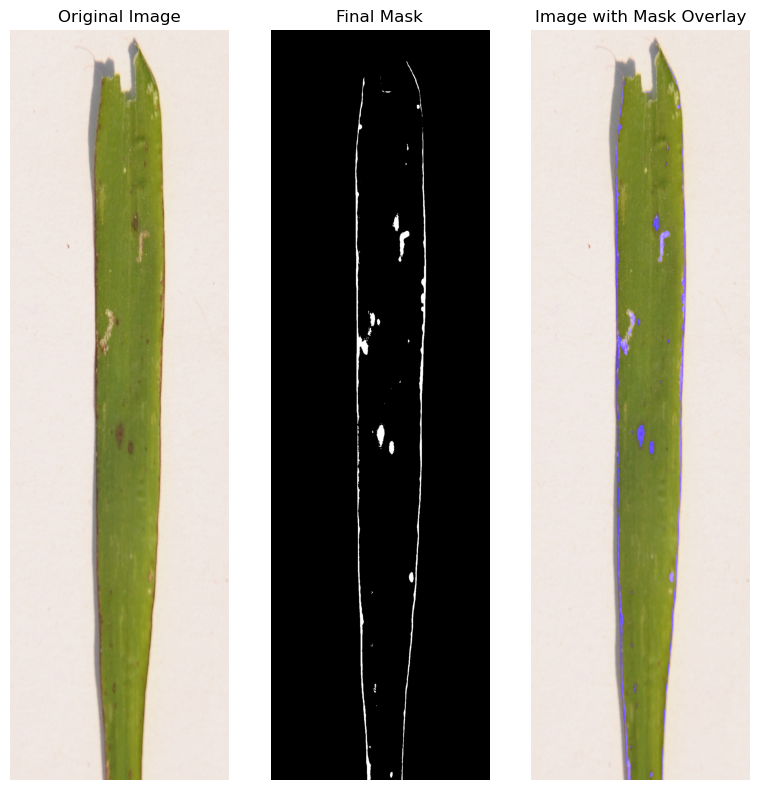

Saved final mask to leaf_smut_masks\DSC_0293.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0293_overlay.jpg


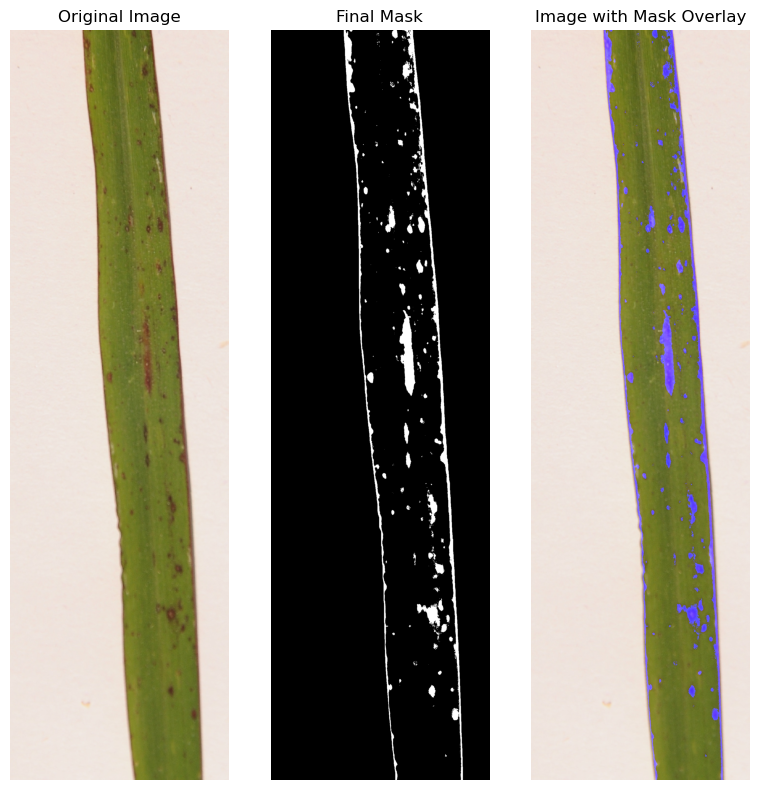

Saved final mask to leaf_smut_masks\DSC_0308.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0308_overlay.jpg


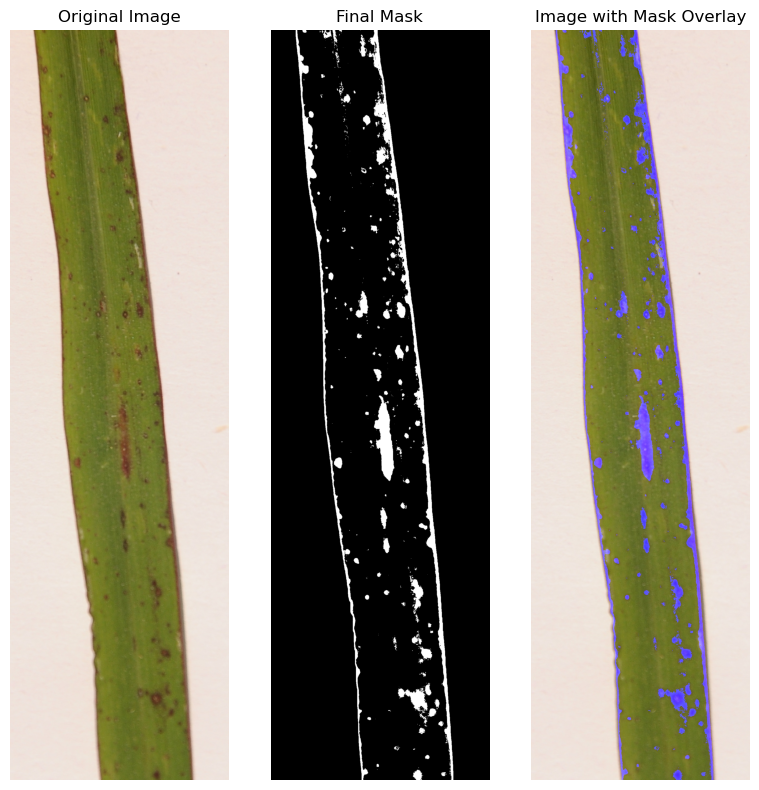

Saved final mask to leaf_smut_masks\DSC_0309.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0309_overlay.jpg


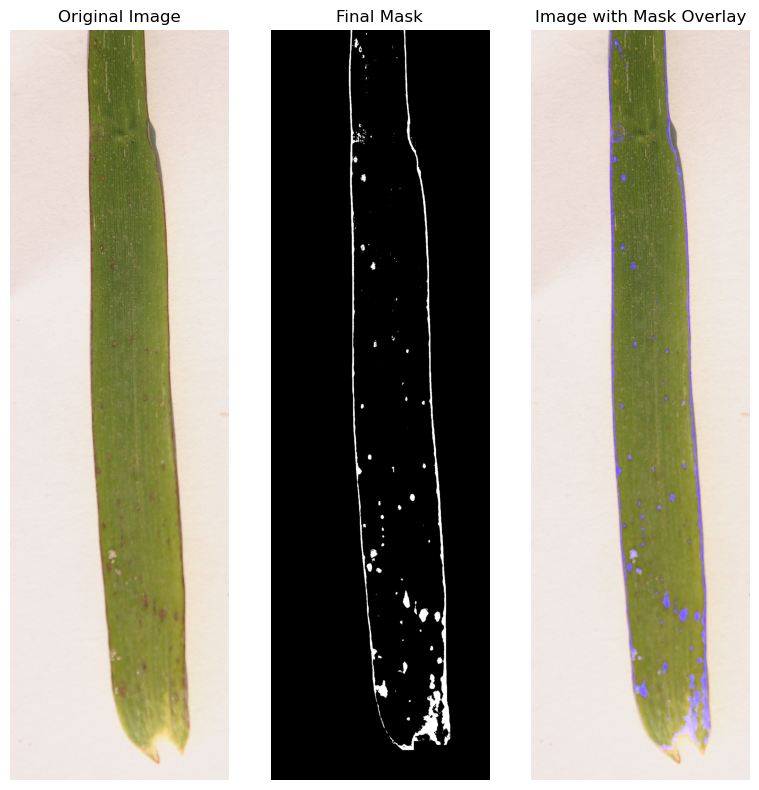

Saved final mask to leaf_smut_masks\DSC_0310.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0310_overlay.jpg


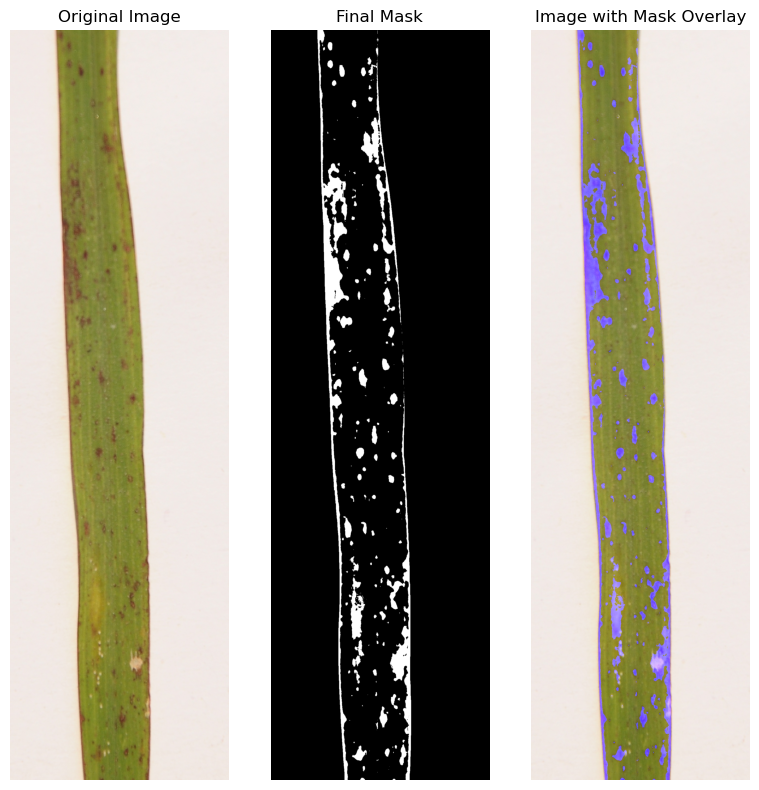

Saved final mask to leaf_smut_masks\DSC_0312.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0312_overlay.jpg


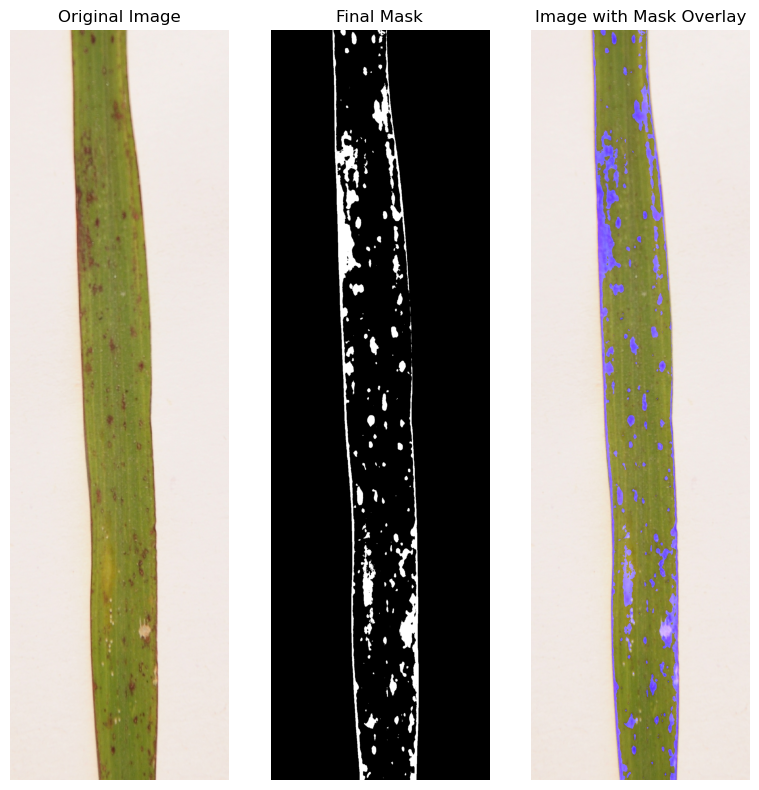

Saved final mask to leaf_smut_masks\DSC_0313.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0313_overlay.jpg


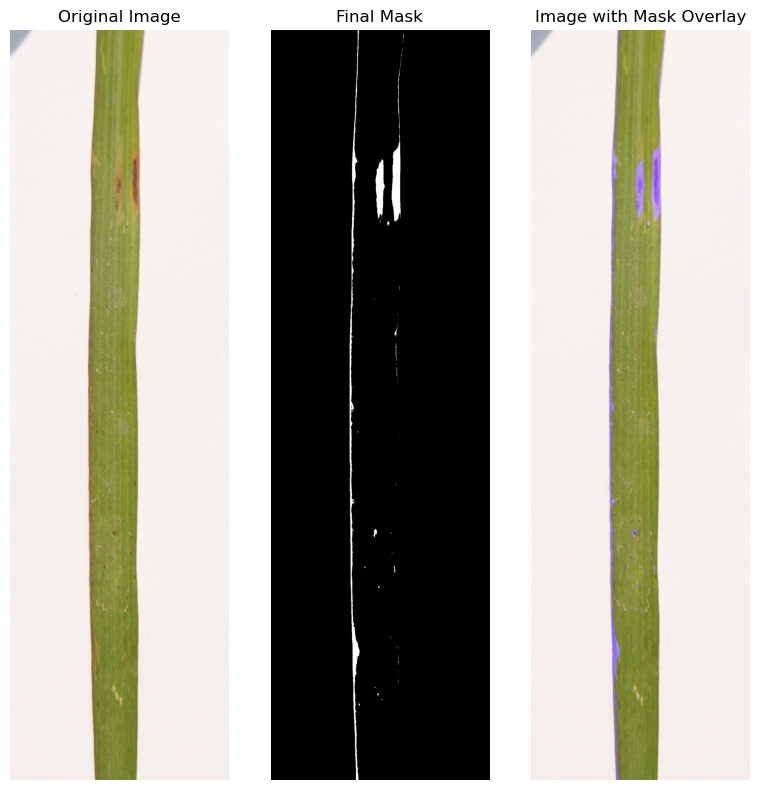

Saved final mask to leaf_smut_masks\DSC_0314.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0314_overlay.jpg


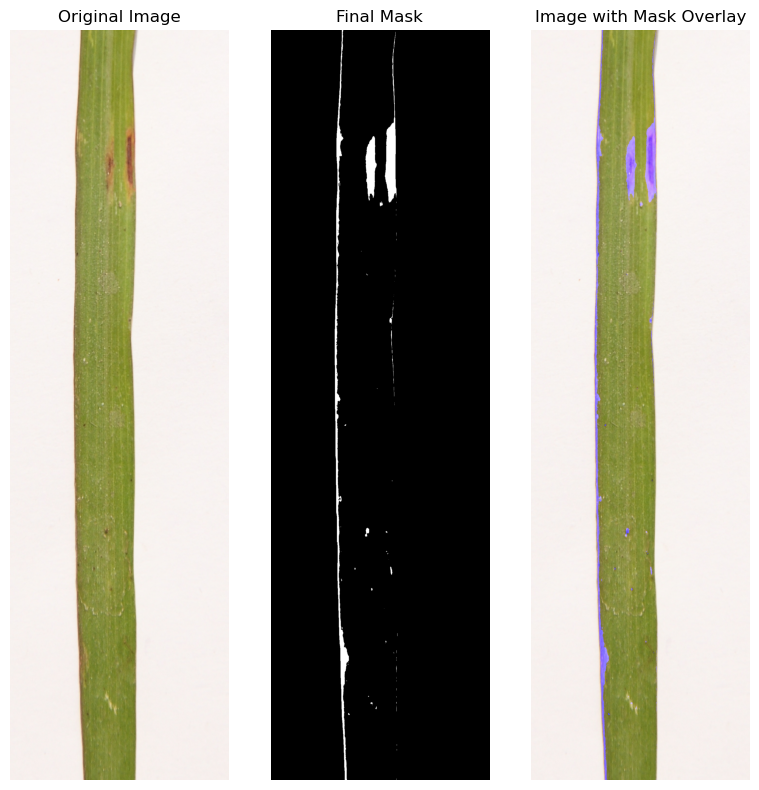

Saved final mask to leaf_smut_masks\DSC_0315.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0315_overlay.jpg


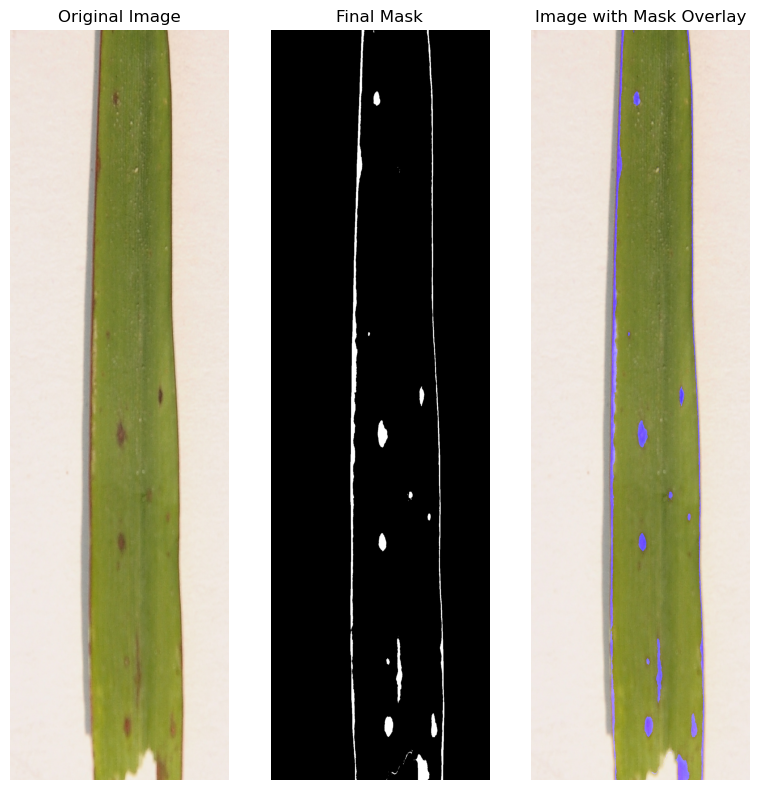

Saved final mask to leaf_smut_masks\DSC_0316.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0316_overlay.jpg


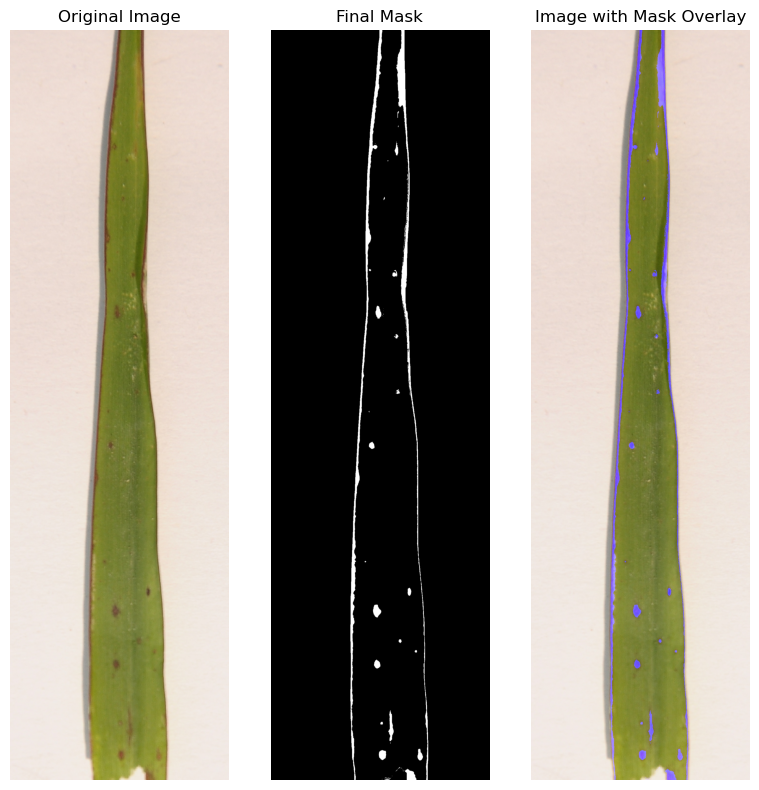

Saved final mask to leaf_smut_masks\DSC_0317.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0317_overlay.jpg


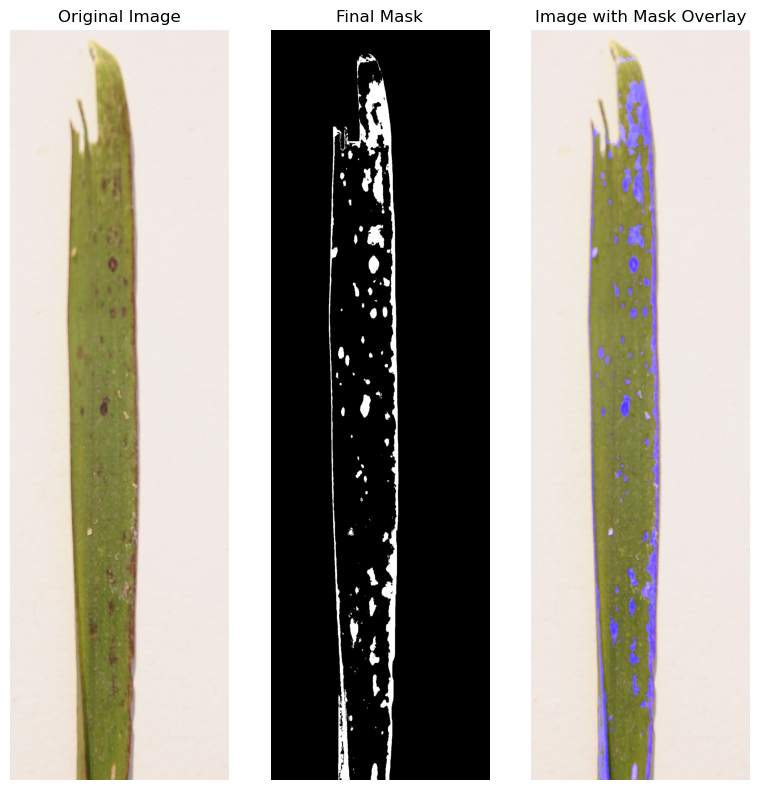

Saved final mask to leaf_smut_masks\DSC_0318.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0318_overlay.jpg


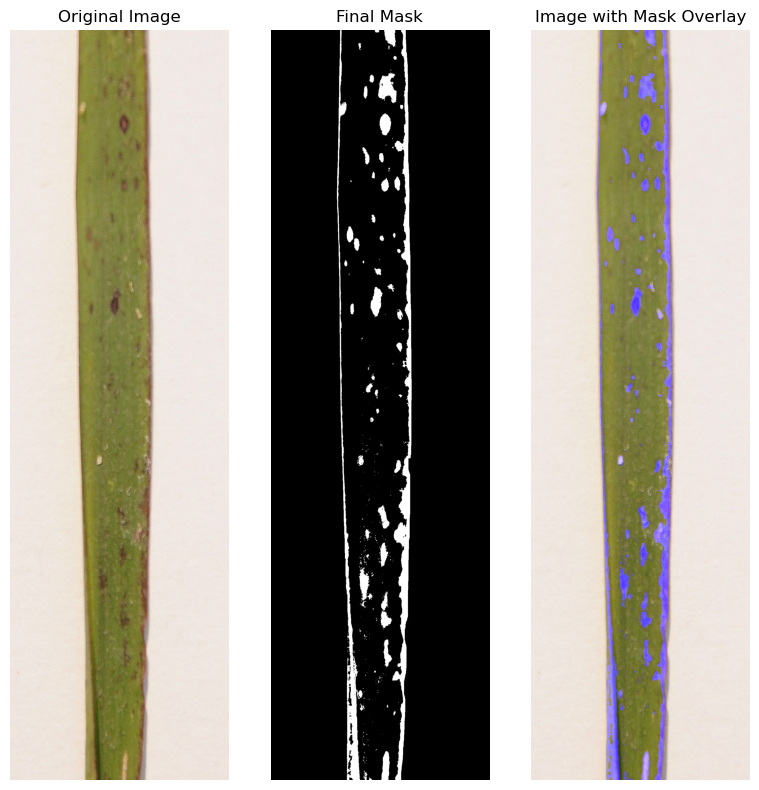

Saved final mask to leaf_smut_masks\DSC_0319.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0319_overlay.jpg


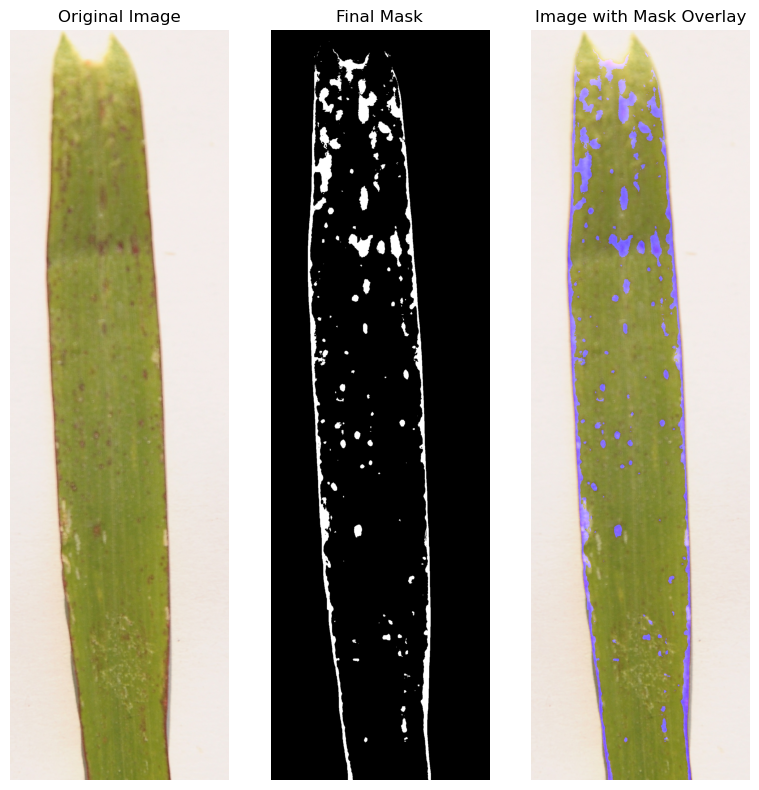

Saved final mask to leaf_smut_masks\DSC_0320.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0320_overlay.jpg


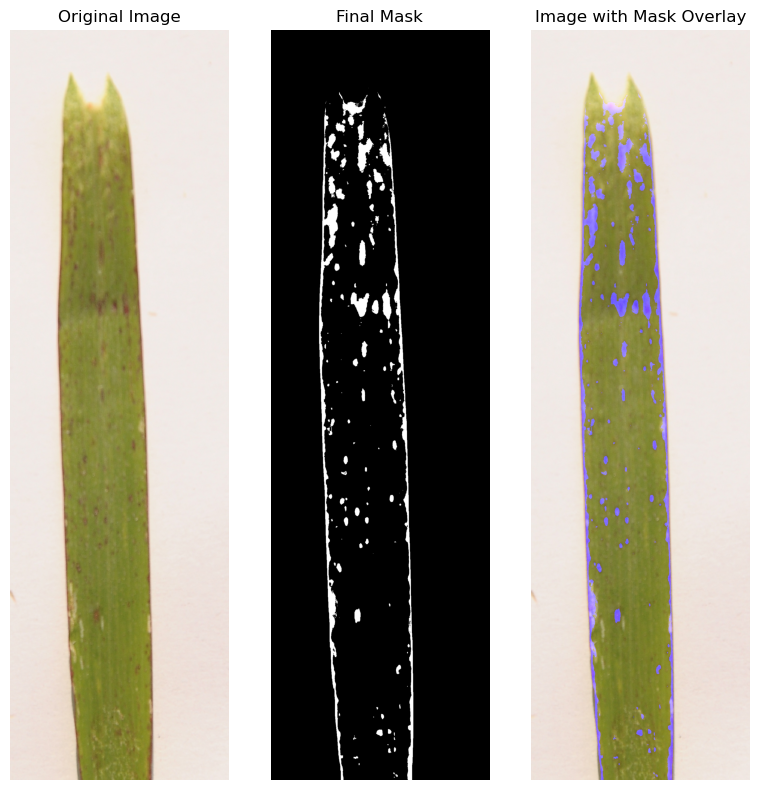

Saved final mask to leaf_smut_masks\DSC_0321.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0321_overlay.jpg


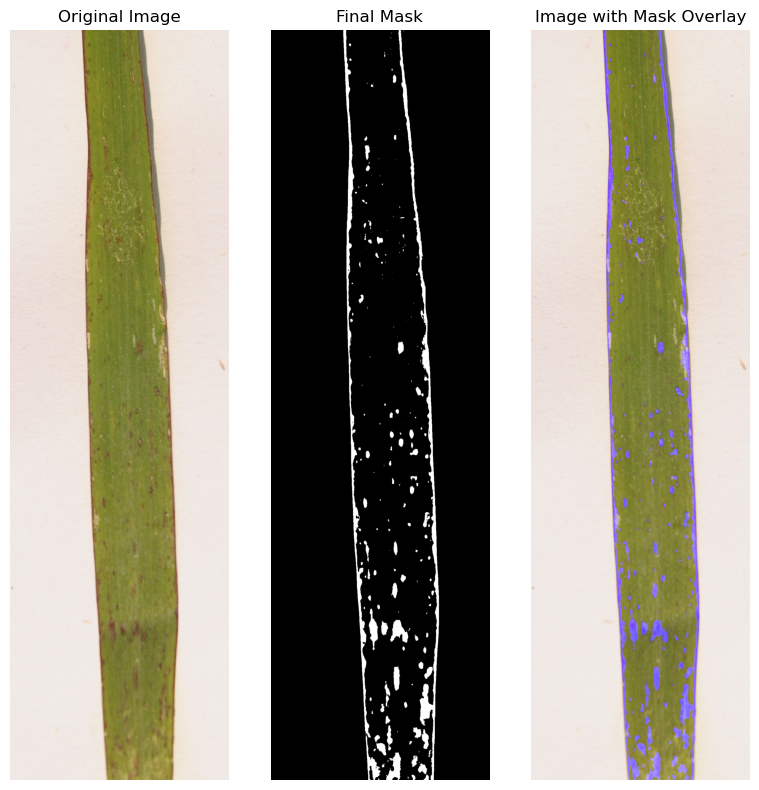

Saved final mask to leaf_smut_masks\DSC_0322.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0322_overlay.jpg


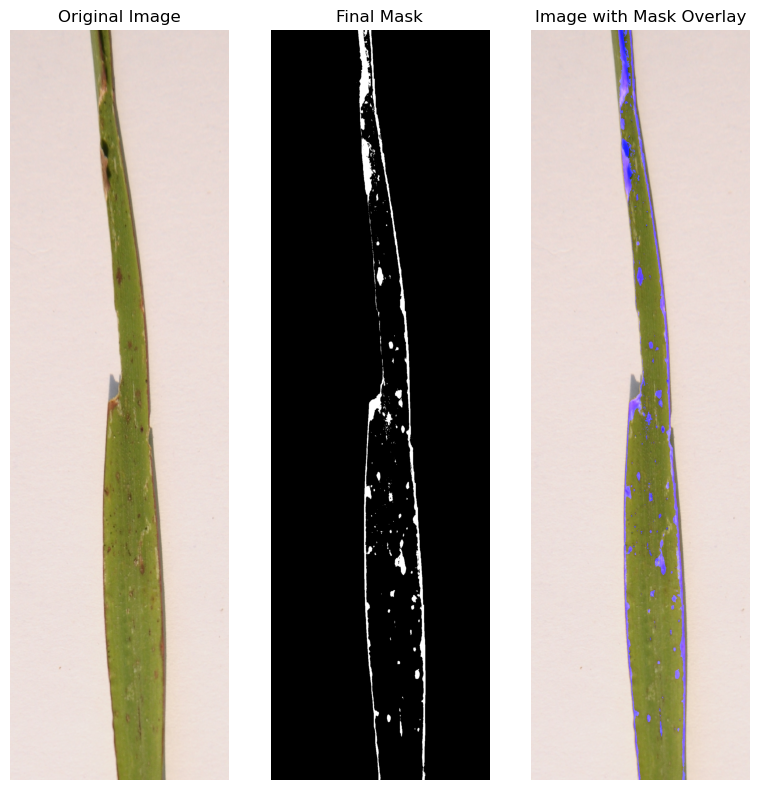

Saved final mask to leaf_smut_masks\DSC_0327.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0327_overlay.jpg


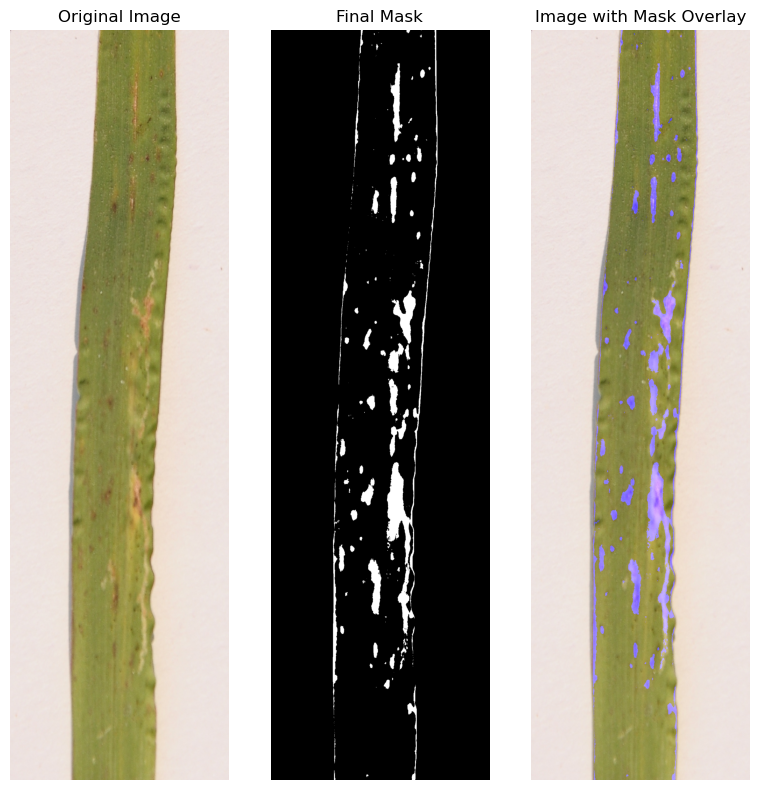

Saved final mask to leaf_smut_masks\DSC_0328.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0328_overlay.jpg


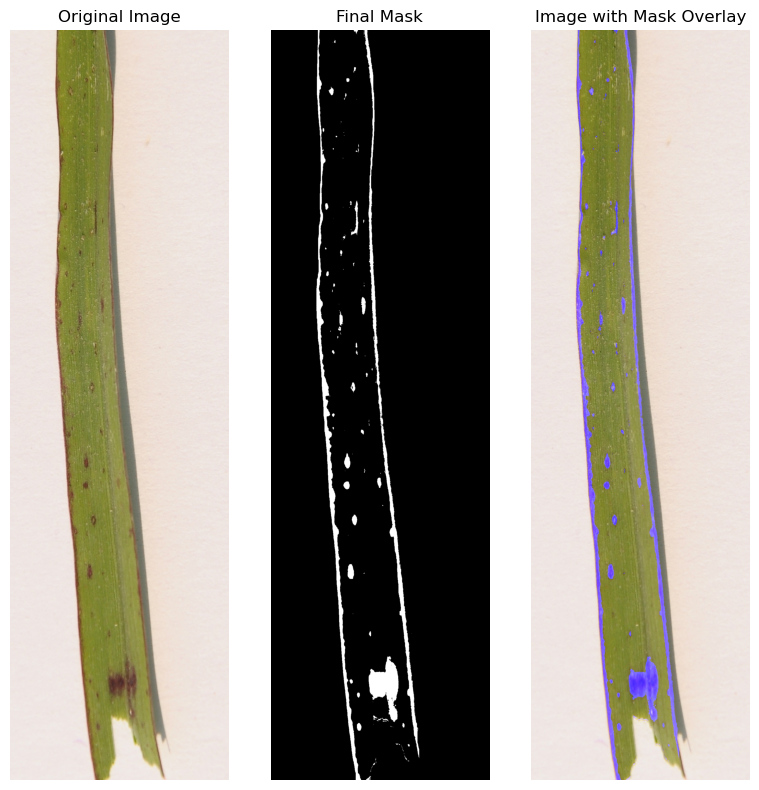

Saved final mask to leaf_smut_masks\DSC_0330.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0330_overlay.jpg


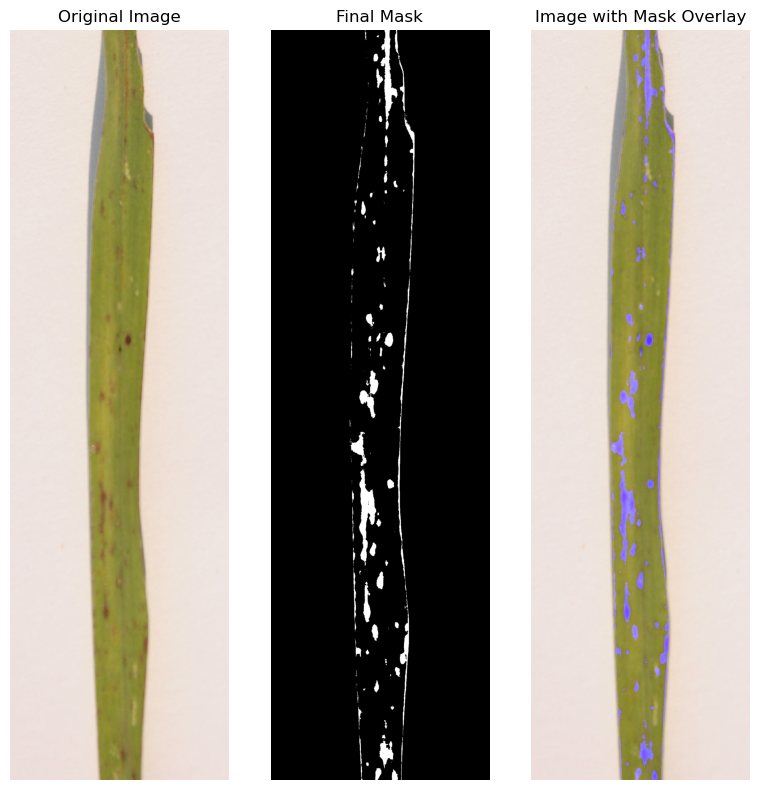

Saved final mask to leaf_smut_masks\DSC_0331.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0331_overlay.jpg


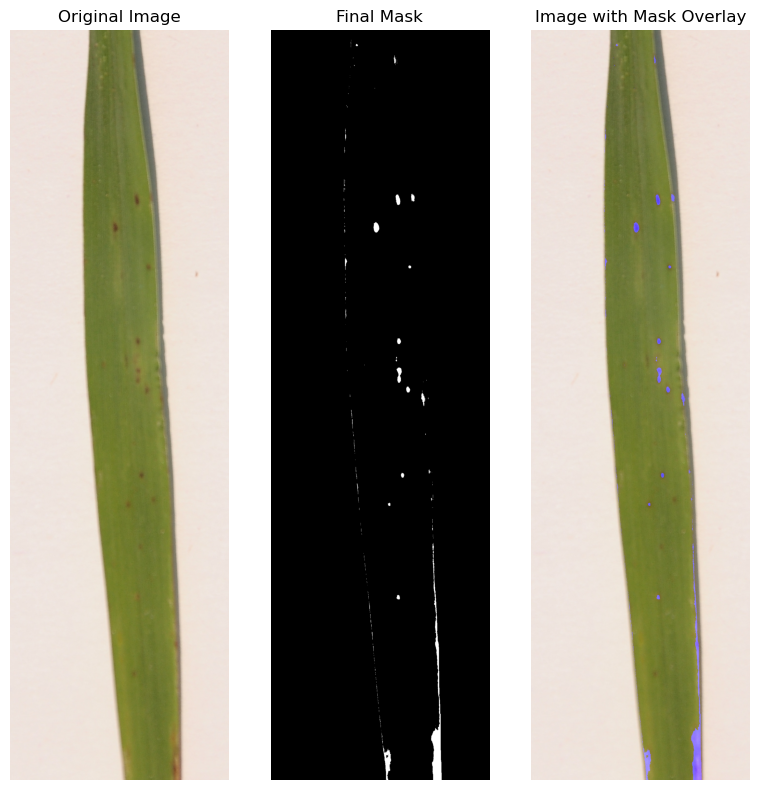

Saved final mask to leaf_smut_masks\DSC_0335.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0335_overlay.jpg


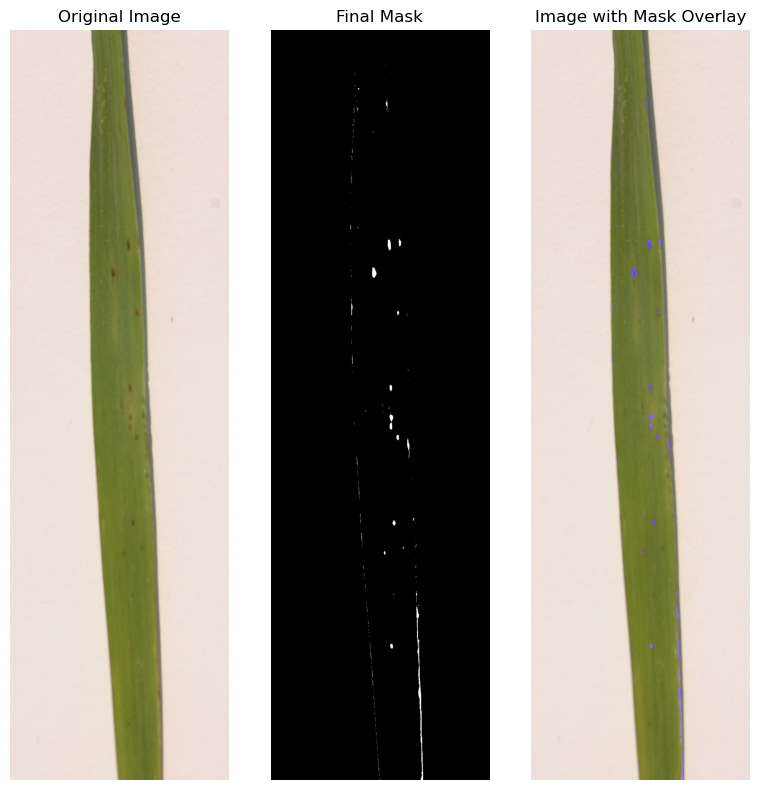

Saved final mask to leaf_smut_masks\DSC_0336.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0336_overlay.jpg


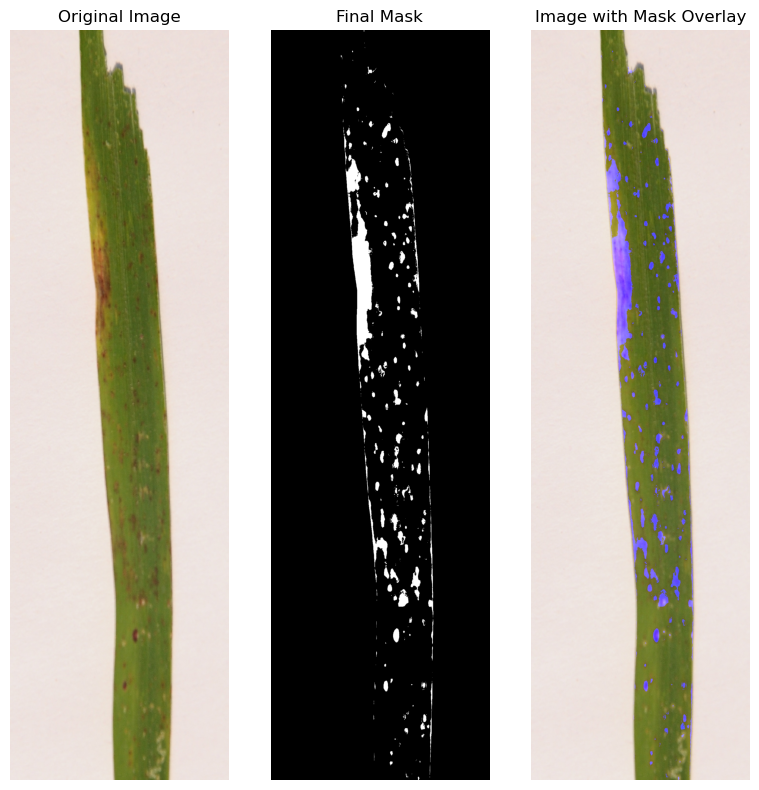

Saved final mask to leaf_smut_masks\DSC_0338.JPG
Saved overlay to leaf_smut_masks\overlays\DSC_0338_overlay.jpg


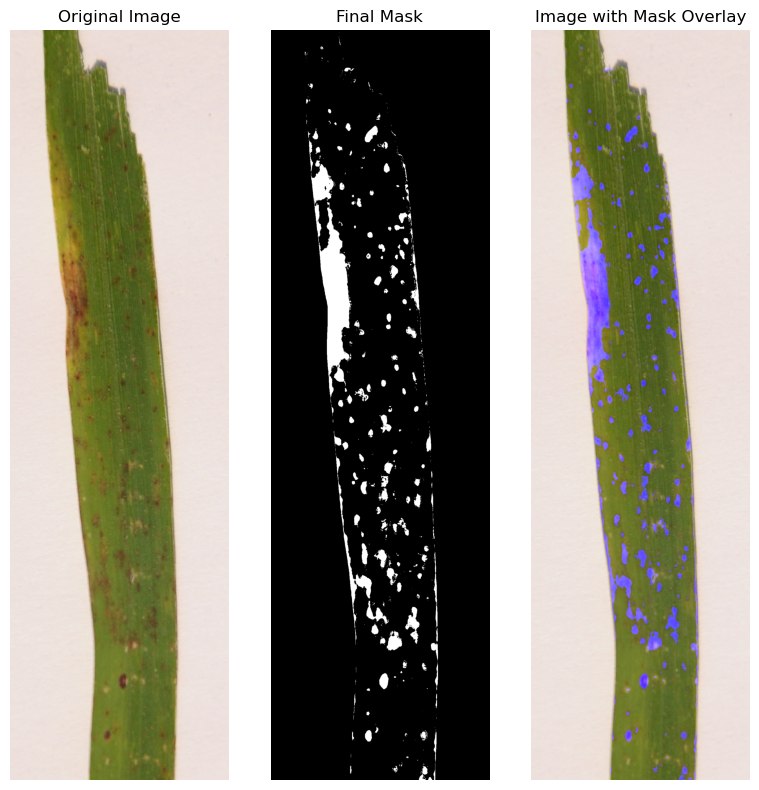

Saved final mask to leaf_smut_masks\DSC_0339.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0339_overlay.jpg


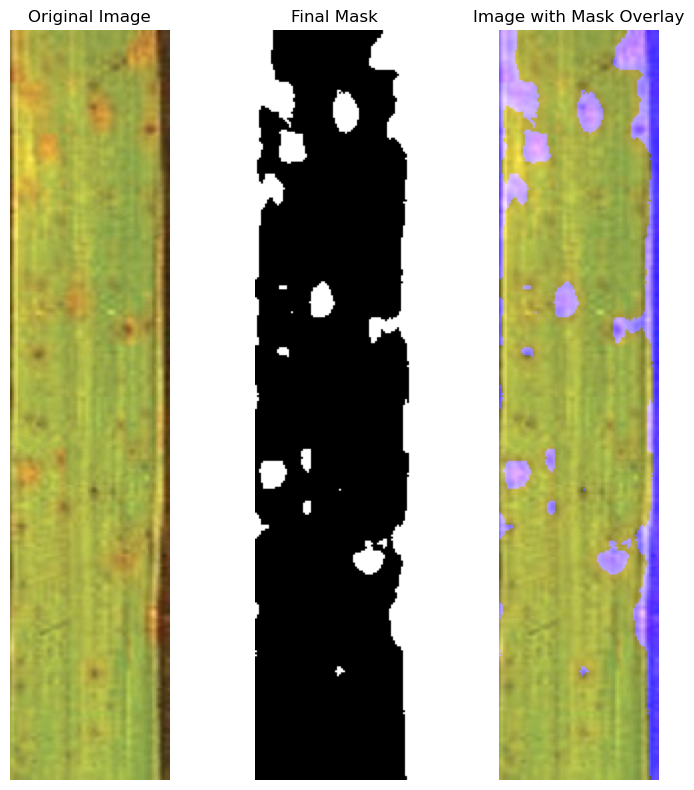

Saved final mask to leaf_smut_masks\DSC_0500.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0500_overlay.jpg


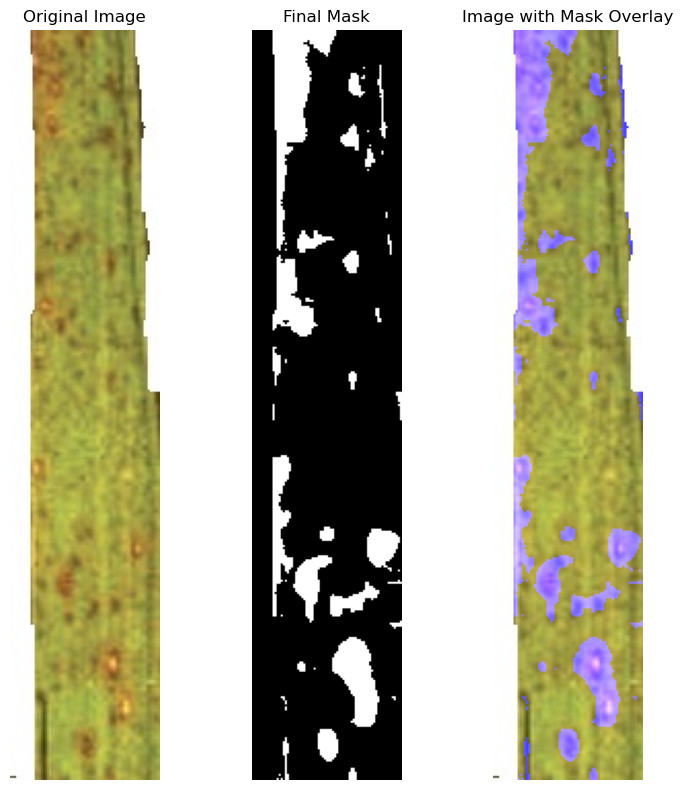

Saved final mask to leaf_smut_masks\DSC_0501.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0501_overlay.jpg


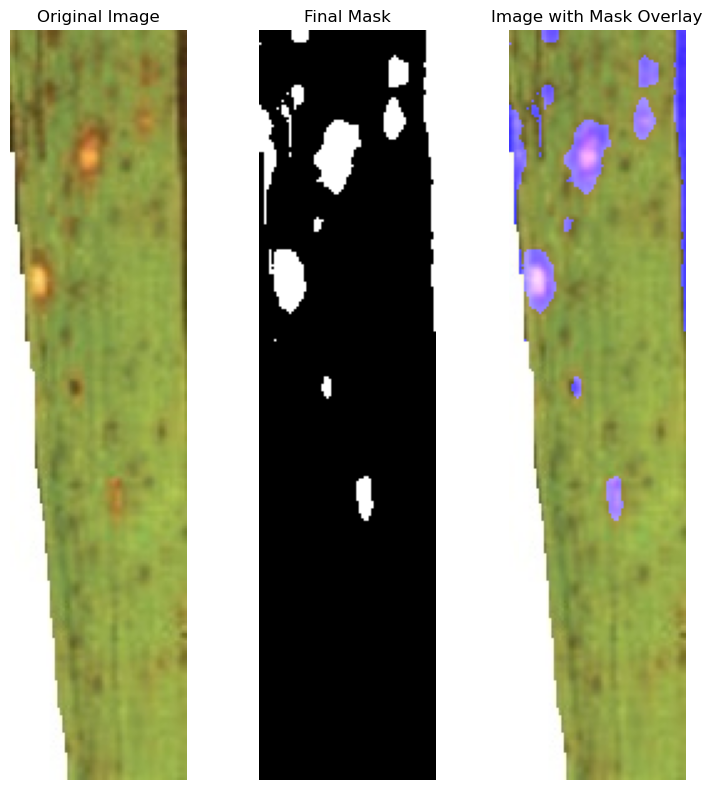

Saved final mask to leaf_smut_masks\DSC_0502.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0502_overlay.jpg


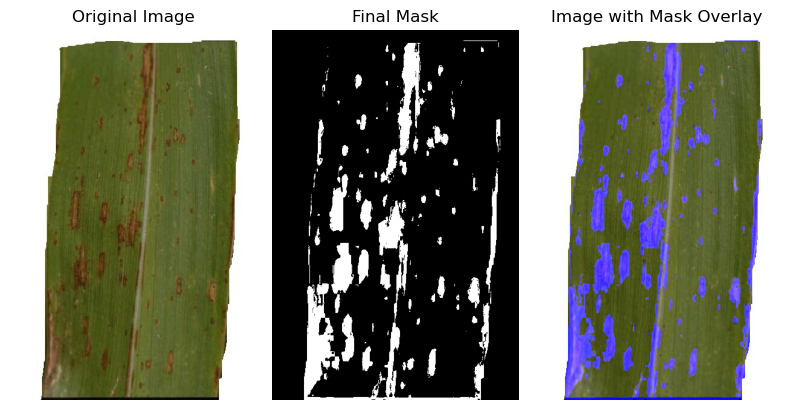

Saved final mask to leaf_smut_masks\DSC_0503.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0503_overlay.jpg


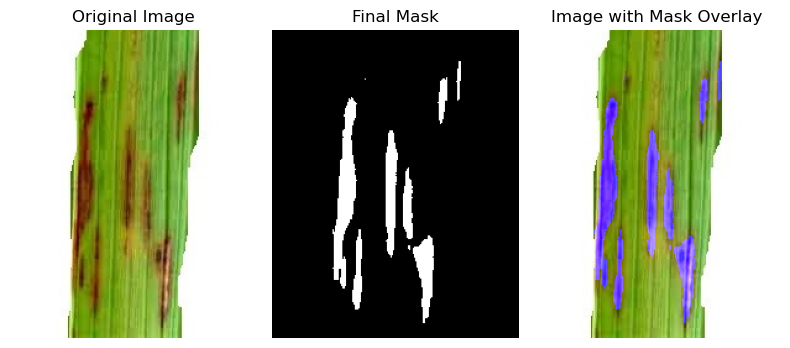

Saved final mask to leaf_smut_masks\DSC_0504.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0504_overlay.jpg


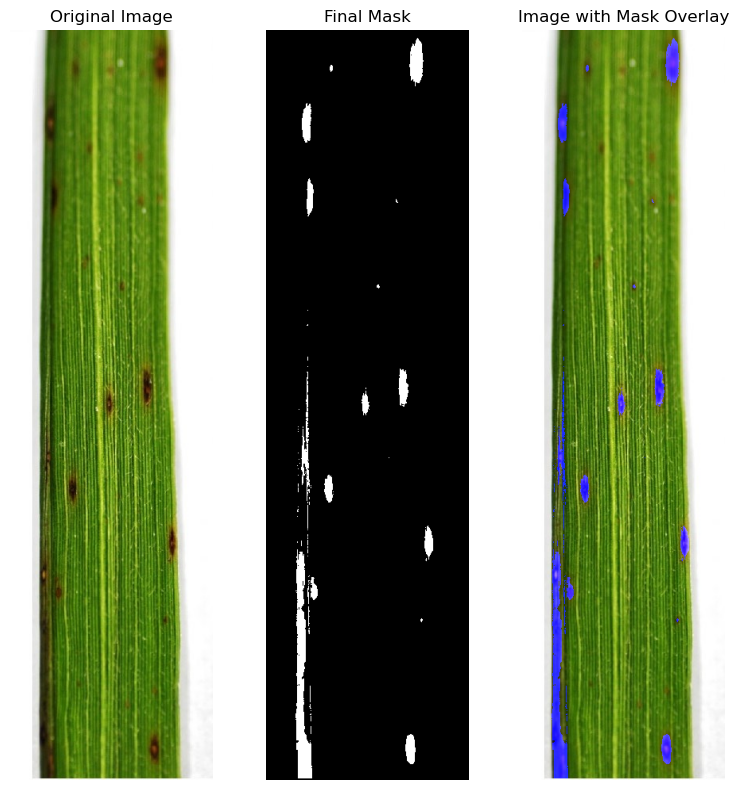

Saved final mask to leaf_smut_masks\DSC_0505.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0505_overlay.jpg


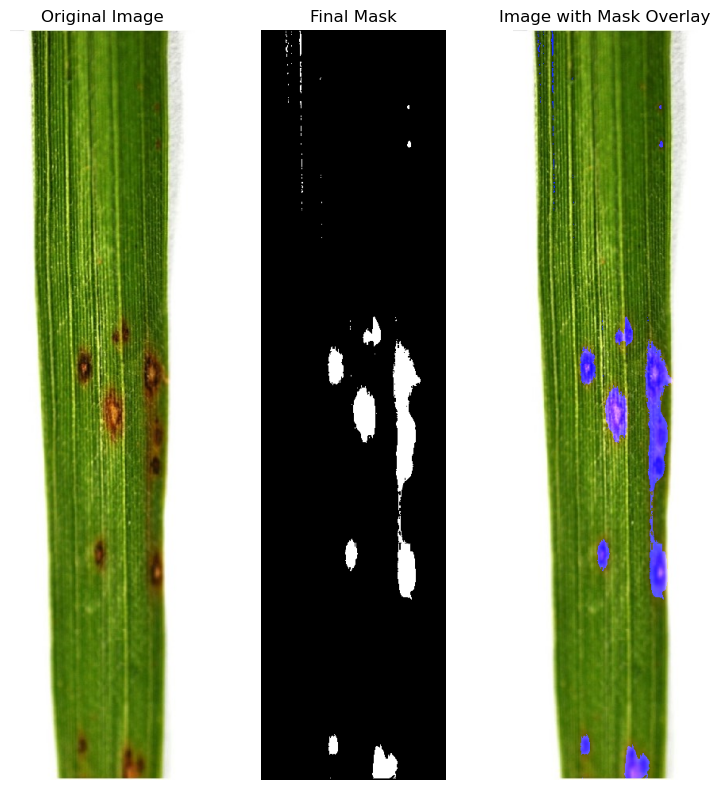

Saved final mask to leaf_smut_masks\DSC_0506.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0506_overlay.jpg


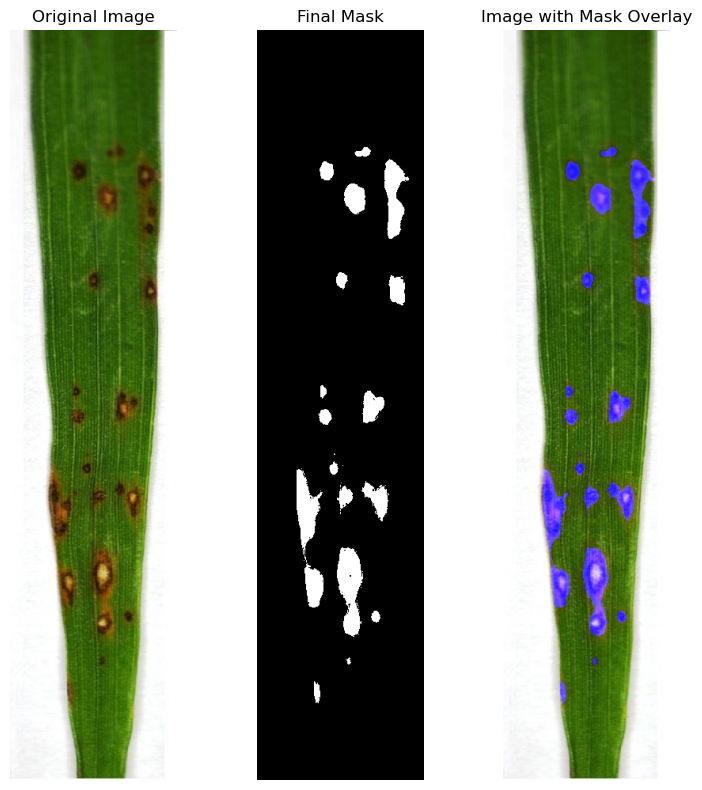

Saved final mask to leaf_smut_masks\DSC_0507.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0507_overlay.jpg


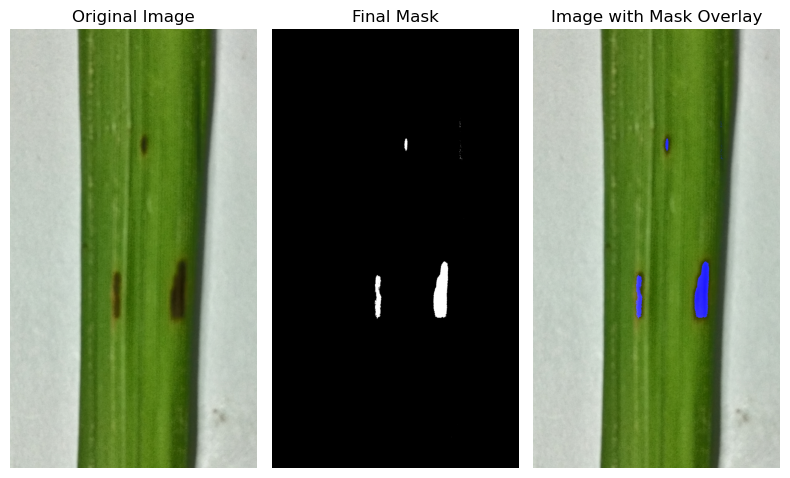

Saved final mask to leaf_smut_masks\DSC_0508.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0508_overlay.jpg


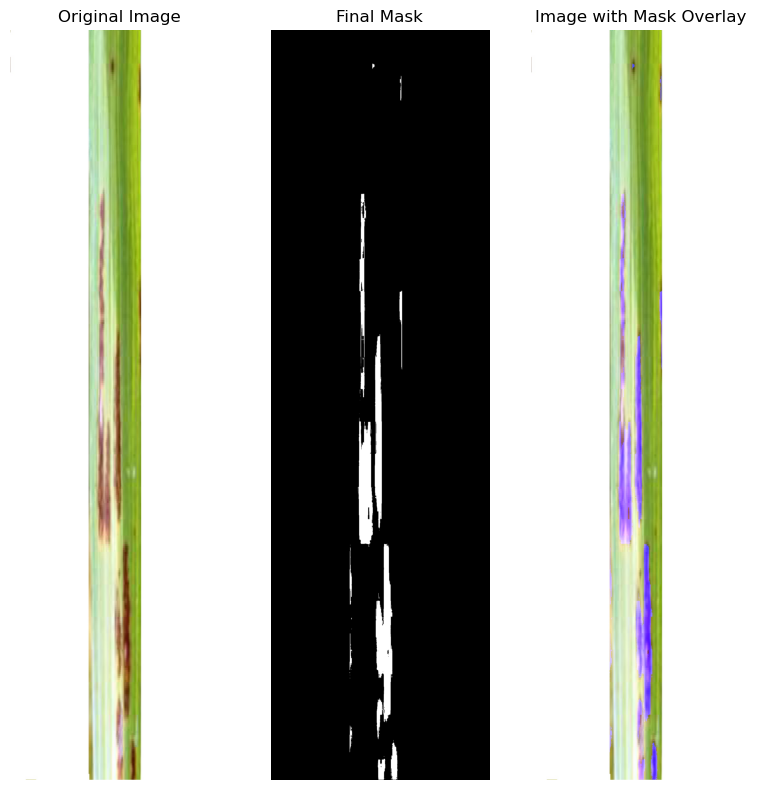

Saved final mask to leaf_smut_masks\DSC_0509.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0509_overlay.jpg


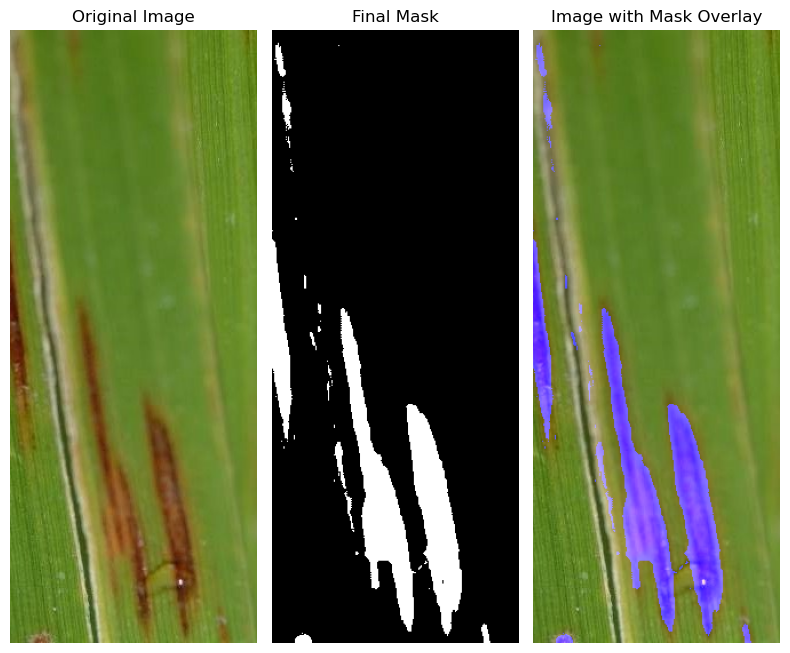

Saved final mask to leaf_smut_masks\DSC_0510.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0510_overlay.jpg


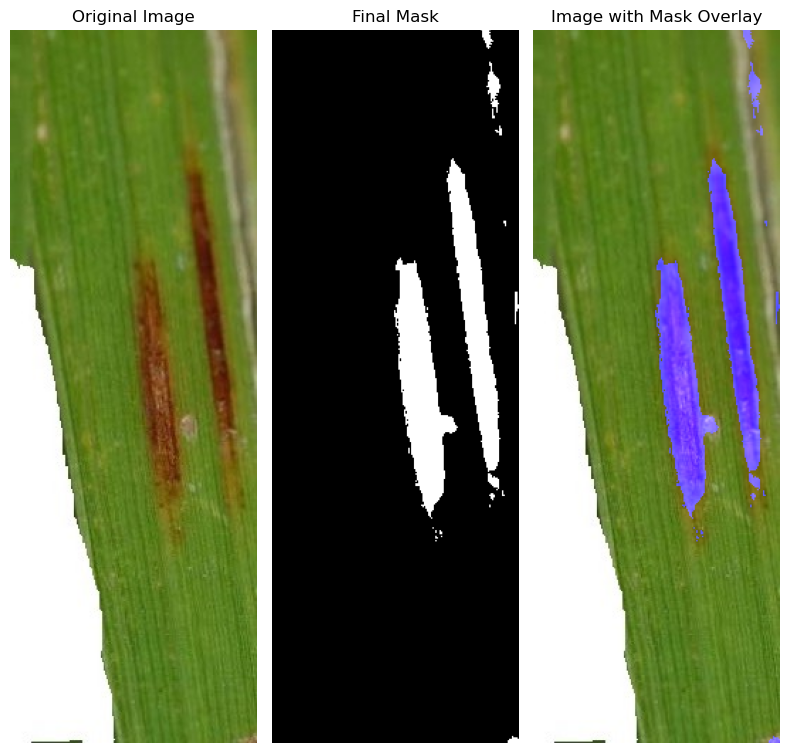

Saved final mask to leaf_smut_masks\DSC_0511.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0511_overlay.jpg


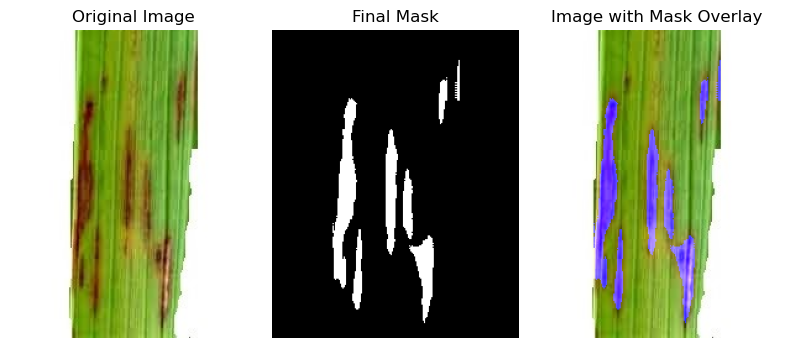

Saved final mask to leaf_smut_masks\DSC_0512.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0512_overlay.jpg


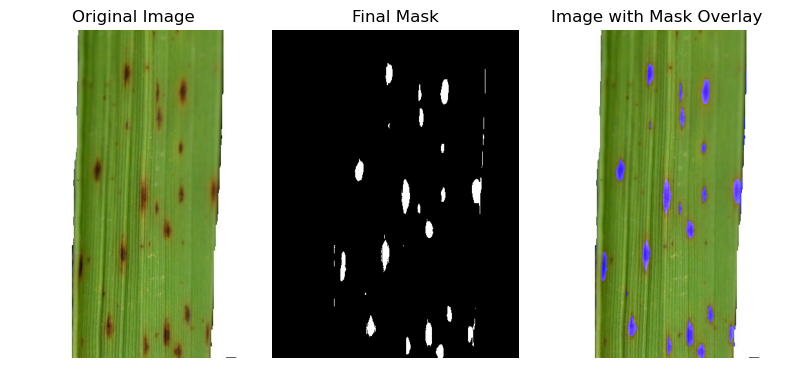

Saved final mask to leaf_smut_masks\DSC_0513.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0513_overlay.jpg


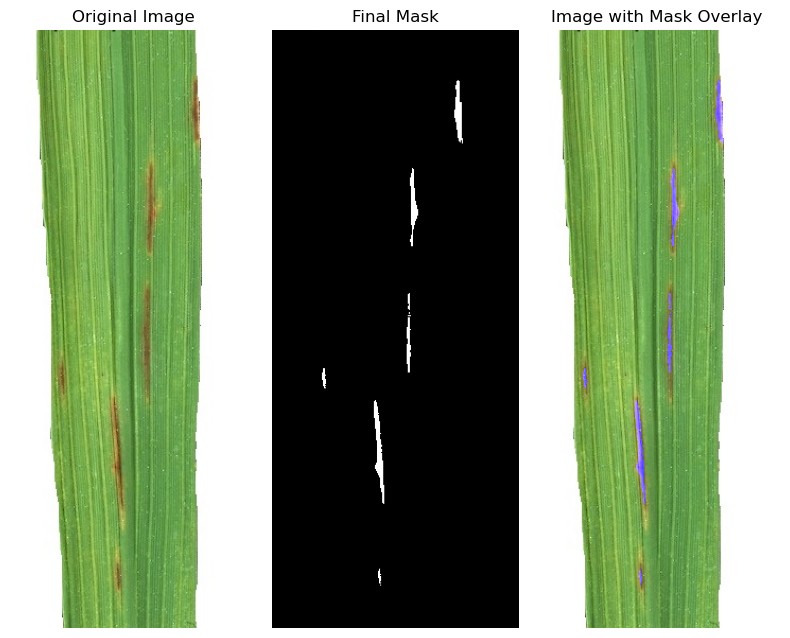

Saved final mask to leaf_smut_masks\DSC_0514.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0514_overlay.jpg


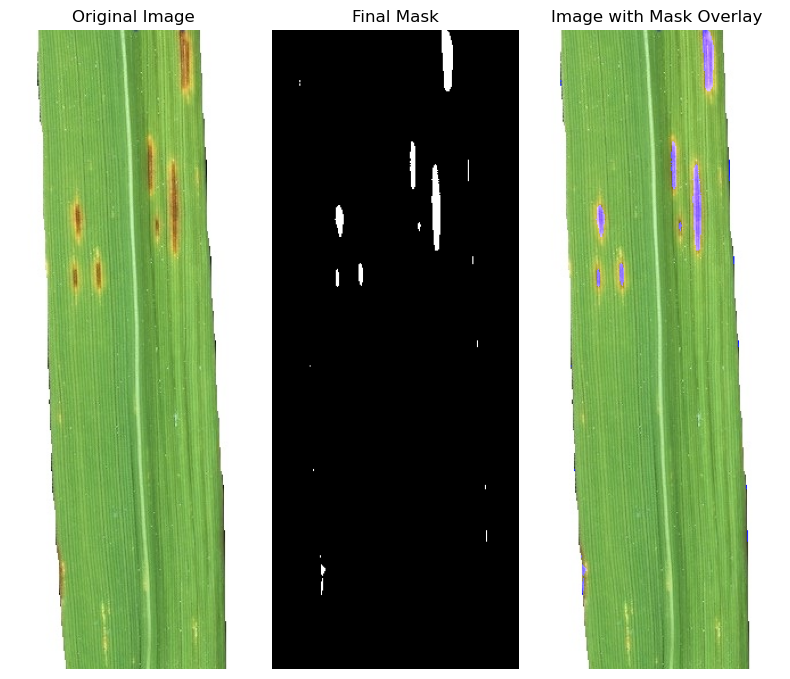

Saved final mask to leaf_smut_masks\DSC_0515.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0515_overlay.jpg


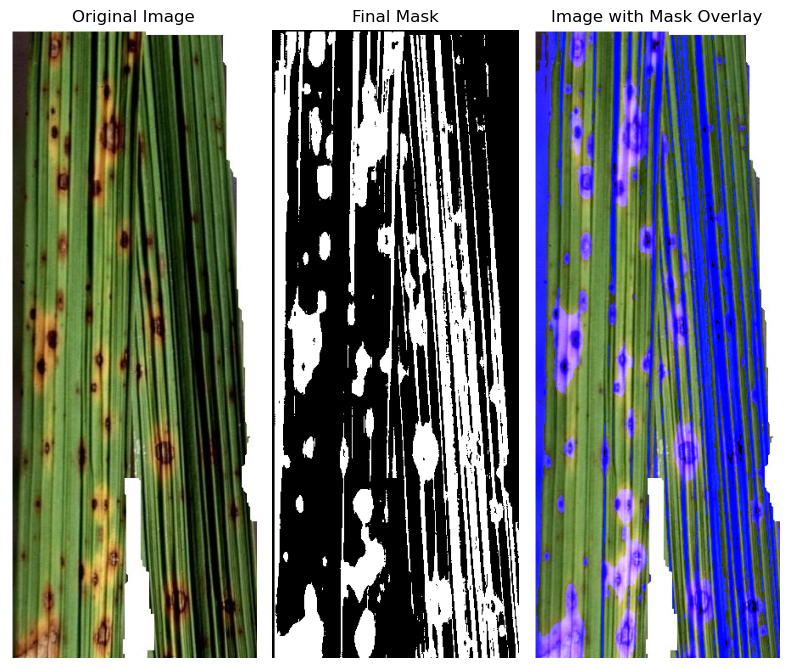

Saved final mask to leaf_smut_masks\DSC_0516.jpg
Saved overlay to leaf_smut_masks\overlays\DSC_0516_overlay.jpg


In [4]:
# Creating masks
input_folder = 'Leaf smut'  
output_folder = 'leaf_smut_masks'  

process_image_folder(input_folder, output_folder)